# snb run_30min_ext

In [1]:
# Env: sc2_v0
import xarray as xr
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import proplot as pplt # New plot library (https://proplot.readthedocs.io/en/latest/)
pplt.rc['savefig.dpi'] = 300 # 1200 is too big! #https://proplot.readthedocs.io/en/latest/basics.html#Creating-figures
from scipy import stats
import calendar
import os

In [2]:
site = 'snb'
site_longname = 'Senator Beck, Colorado, US'
y_start = 2005
y_end = 2015

# labels = ['Ref_30min_ext', 'EZERO_30min_ext']

labels = [
    'DEF',
    # 'BUG_CORRECT',
    # 'BUG_CORRECT_TSNBT_OP1',
    'BUG_CORRECT_TSNBT_OP1_EZERO',
    # 'PHYS_ALL_SUBLI_CORRECT',
    'PHYS_ALL_SUBLI_v2',
    # 'PHYS_ALL_SUBLI_CORRECT_COMPAC',
    'PHYS_ALL_SUBLI_v2_COMPAC_v1',
    'PHYS_ALL_SUBLI_v2_COMPAC_v1_calonne', # Best without TVC (COMPACT_2.5)
    'PHYS_ALL_SUBLI_v2_COMPAC_2.5_LIM_3.5_calonne', # best with TVC

]

root_path = '/home/mickael-lalande/eccc/classic-develop/outputFiles/SnowMIP/'+site+'/'
paths = [root_path+'run_'+label for label in labels]

# ds_yr_list = [xr.open_mfdataset(path+'/*_annually.nc').squeeze().load() for path in paths]
# ds_mo_list = [xr.open_mfdataset(path+'/*_monthly.nc').squeeze().load() for path in paths]
ds_d_list = [xr.open_mfdataset(path+'/*_daily.nc').squeeze().load() for path in paths]
# ds_hh_list = [xr.open_mfdataset(path+'/*_halfhourly.nc').squeeze().load() for path in paths]

In [3]:
path = "/home/mickael-lalande/eccc/classic-develop/inputFiles/SnowMIP/"+site
rsfile = xr.open_dataset(path+'/rsfile_spinup-final_Ref_30min_ext.nc')

In [4]:
def assign_center_depth(ds, rsfile):
    layer_c = []
    for i in range(len(rsfile.DELZ)):
        if i == 0:
            layer_c.append(rsfile.DELZ.cumsum().values[i]/2)
        else:
            layer_c.append(rsfile.DELZ.cumsum().values[i-1] + rsfile.DELZ.values[i]/2)
    with xr.set_options(keep_attrs=True):
        ds = ds.assign_coords(layer=ds.layer*0+layer_c)
    return ds

In [5]:
for i in range(len(labels)):
    # ds_yr_list[i] = assign_center_depth(ds_yr_list[i], rsfile)
    # ds_mo_list[i] = assign_center_depth(ds_mo_list[i], rsfile)
    ds_d_list[i] = assign_center_depth(ds_d_list[i], rsfile)
    # ds_hh_list[i] = assign_center_depth(ds_hh_list[i], rsfile)

In [6]:
# # Paul's SnowMIP data

# path_paul = '/home/mickael-lalande/Dropbox/data/SnowMIP/Paul/CLASS_Results'
# label_paul = "SnowMIP"

# df_paul = pd.read_csv(path_paul+'/CLASS_sv_REF_'+site+'_'+str(y_start)+'_'+str(y_end)+'.txt', delim_whitespace=True)
# df_paul.index = pd.to_datetime(df_paul[['year', 'month', 'day', 'hour']]).values
# df_paul= df_paul.drop(columns=['year', 'month', 'day', 'hour'])
# df_paul.albsn = df_paul.albsn.replace({0 : np.nan})
# df_paul.albs = df_paul.albs.replace({0 : np.nan})
# df_paul.tsn = df_paul.tsn.replace({-999 : np.nan})
# df_paul.tsns = df_paul.tsns.replace({-999 : np.nan})
# ds_paul_h = df_paul.to_xarray()
# ds_paul_h = ds_paul_h.rename({'index': 'time'})
# ds_paul_h.load()

# ds_paul_d = ds_paul_h.resample(time='D').mean().load()
# ds_paul_d = ds_paul_d.assign_coords(layer=[0.05 , 0.225, 2.225]) # center of Paul's soil layers (DELZ = [0.1, 0.25, 3.75])

In [7]:
# # Combine the soil temperature in one variable
# ds_paul_d = ds_paul_d.assign(
#     tsl=(('layer', 'time'), [
#         list(ds_paul_d['tsl:1'].values),
#         list(ds_paul_d['tsl:2'].values),
#         list(ds_paul_d['tsl:3'].values),
#     ])
# )

Text(0.5, 0.98, 'Senator Beck, Colorado, US')

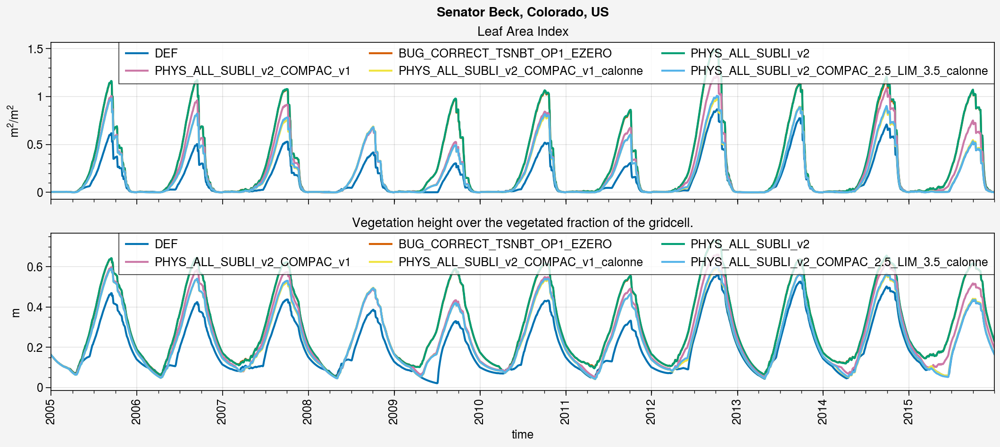

In [8]:
fig, axs = pplt.subplots(ncols=1, nrows=2, refaspect=6, refwidth=10, sharey=0)

for ds_d, label in zip(ds_d_list, labels):
    axs[0].plot(ds_d.lai, label=label)
    axs[1].plot(ds_d.vegHeight, label=label)

axs[0].format(ylabel=ds_d_list[0].lai.units, title=ds_d_list[0].lai.long_name)
axs[1].format(ylabel=ds_d_list[0].vegHeight.units, title=ds_d_list[0].vegHeight.long_name)

for ax in axs:
    ax.legend()

fig.suptitle(site_longname)

Text(0.5, 0.98, 'Senator Beck, Colorado, US (2005-2015)')

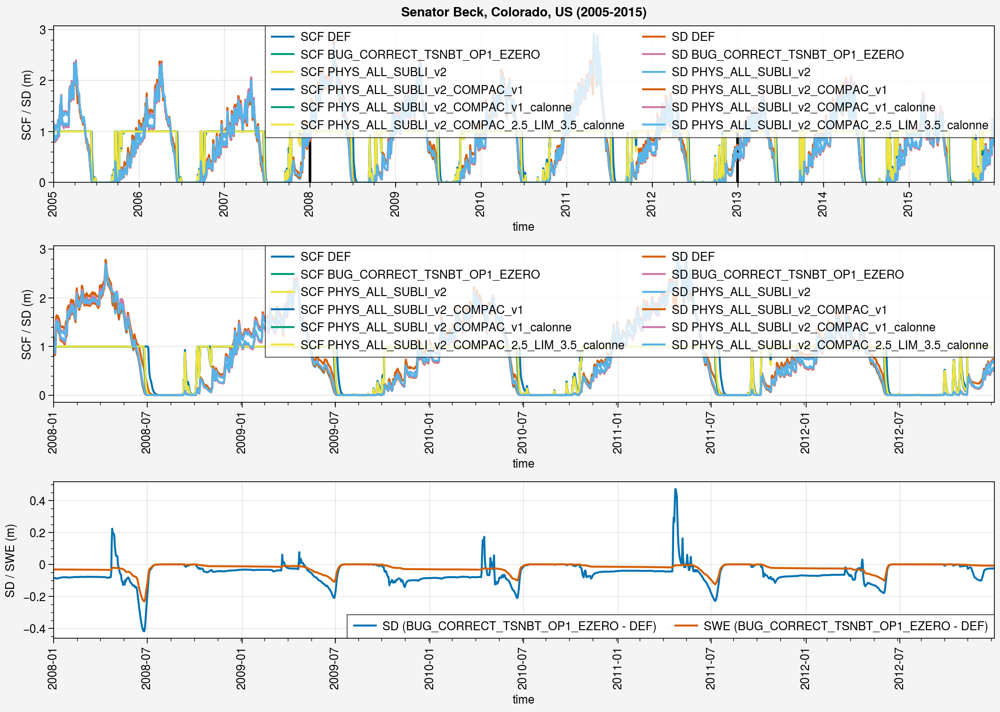

In [9]:
if len(labels) > 1:
    nrows = 3
else: 
    nrows = 2
    
fig, axs = pplt.subplots(ncols=1, nrows=nrows, refaspect=6, refwidth=10, share=0)

##################
### All period ###
##################
start = str(y_start)
end = str(y_end)

for ds_d, label in zip(ds_d_list, labels):
    axs[0].plot(ds_d.snc.sel(time=slice(start,end)), label='SCF '+label)
    axs[0].plot(ds_d.snd.sel(time=slice(start,end)), label='SD '+label)

axs[0].legend(ncols=2, loc='ur')
axs[0].format(
    ylabel='SCF / SD (m)'
)


############
### Zoom ###
############
start = str(y_start+3)
end = str(y_end-3)

for ds_d, label in zip(ds_d_list, labels):
    axs[1].plot(ds_d.snc.sel(time=slice(start,end)), label='SCF '+label)
    axs[1].plot(ds_d.snd.sel(time=slice(start,end)), label='SD '+label)

axs[0].vlines(ds_d_list[0].sel(time=slice(start,end)).time[0], ds_d_list[0].snc.min(), ds_d_list[0].snc.max(), color='k', lw=2)
axs[0].vlines(ds_d_list[0].sel(time=slice(start,end)).time[-1], ds_d_list[0].snc.min(), ds_d_list[0].snc.max(), color='k', lw=2)

axs[1].legend(ncols=2, loc='ur')
axs[1].format(
    ylabel='SCF / SD (m)'
)

if nrows == 3:
    #####################
    ### SWE / SD diff ###
    #####################
    axs[2].plot((ds_d_list[1]-ds_d_list[0]).snd.sel(time=slice(start,end)), label='SD ('+labels[1]+' - '+labels[0]+')')
    axs[2].plot(((ds_d_list[1]-ds_d_list[0]).snw*1e-3).sel(time=slice(start,end)), label='SWE ('+labels[1]+' - '+labels[0]+')')
    
    axs[2].legend(ncols=2)
    axs[2].format(
        ylabel='SD / SWE (m)'
    )

fig.suptitle(site_longname+' ('+str(y_start)+'-'+str(y_end)+')')


## Compare with obs

In [10]:
path_menard2019 = '/home/mickael-lalande/Dropbox/data/ESM-SnowMIP_all'

ds_h_eval_menard2019 = xr.open_dataset(path_menard2019+'/obs_insitu_'+site+'_'+str(y_start)+'_'+str(y_end)+'.nc').load()
ds_d_eval_menard2019 = ds_h_eval_menard2019.resample(time='D').mean().load()
ds_h_eval_menard2019

<xarray.Dataset>
Dimensions:   (time: 87648, sdepth: 3)
Coordinates:
  * time      (time) datetime64[ns] 2005-10-01T01:00:00 ... 2015-10-01
  * sdepth    (sdepth) float32 0.1 0.2 0.25
Data variables:
    albs      (time) float32 nan nan nan nan nan nan ... nan nan nan nan nan nan
    snd_auto  (time) float32 nan nan nan nan nan nan ... nan nan nan nan nan nan
    snd_man   (time) float32 nan nan nan nan nan nan ... nan nan nan nan nan nan
    snw_man   (time) float32 nan nan nan nan nan nan ... nan nan nan nan nan nan
    ts        (time) float32 nan nan nan nan nan nan ... nan nan nan nan nan nan
    tsl       (time, sdepth) float32 nan nan nan nan nan ... nan nan nan nan nan

In [11]:
tot_year = y_end - y_start + 1
gap = 2
years = pplt.arange(y_start, y_end)
years

array([2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015])

### SD

In [12]:
ds_d_eval_menard2019

<xarray.Dataset>
Dimensions:   (sdepth: 3, time: 3653)
Coordinates:
  * sdepth    (sdepth) float32 0.1 0.2 0.25
  * time      (time) datetime64[ns] 2005-10-01 2005-10-02 ... 2015-10-01
Data variables:
    albs      (time) float32 0.5912 0.2855 0.21 0.1991 ... 0.2173 0.216 nan
    snd_auto  (time) float32 0.026 0.061 0.041 0.069 0.053 ... nan nan nan nan
    snd_man   (time) float32 nan nan nan nan nan nan ... nan nan nan nan nan nan
    snw_man   (time) float32 nan nan nan nan nan nan ... nan nan nan nan nan nan
    ts        (time) float32 nan nan nan nan nan nan ... nan nan nan nan nan nan
    tsl       (time, sdepth) float32 3.364 3.915 4.099 3.25 ... nan nan nan

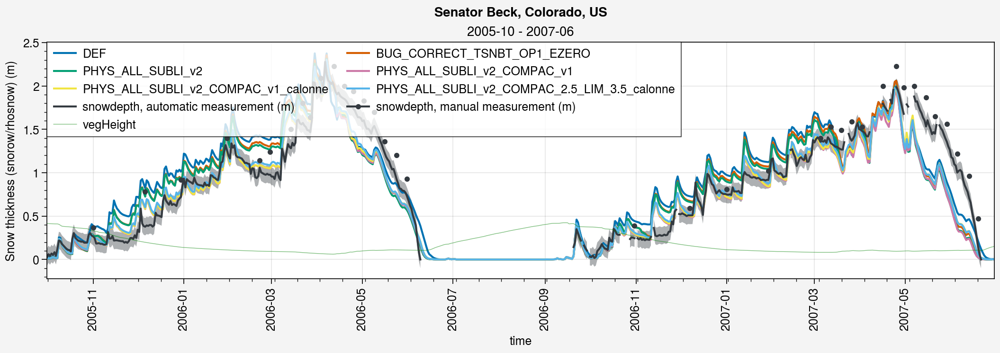

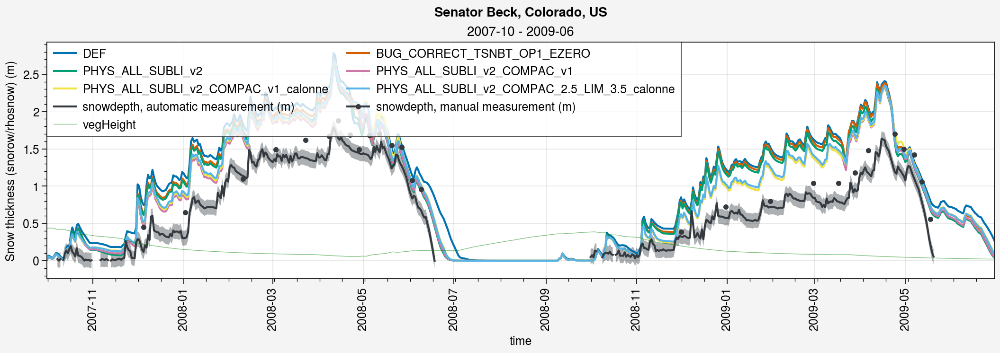

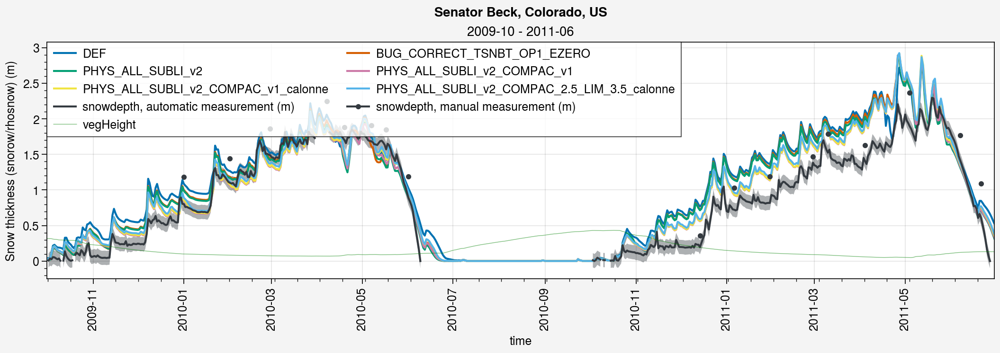

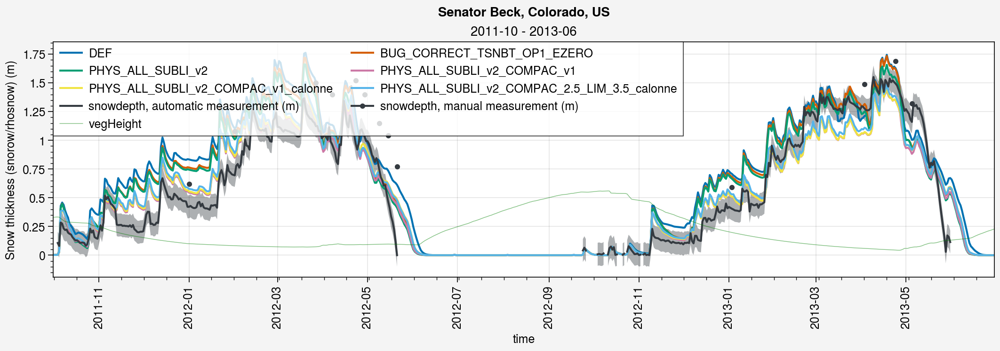

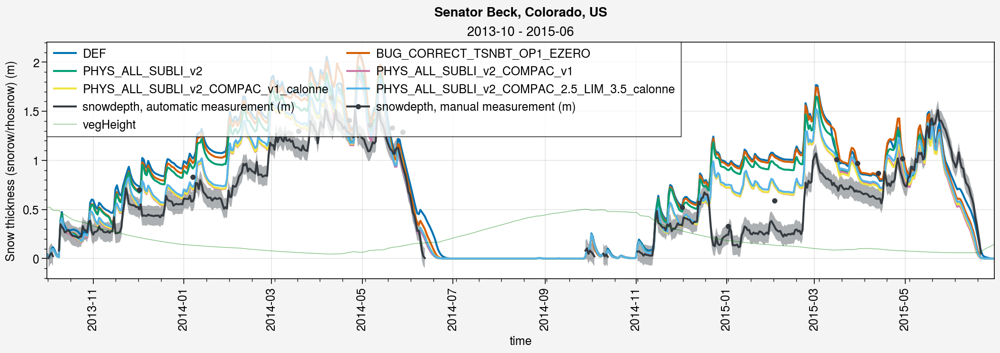

In [13]:
%matplotlib inline

color_obs = 'gray8'

for i in range(tot_year//gap):
    fig, axs = pplt.subplots(ncols=1, nrows=1, refaspect=4, refwidth=10)

    if i*gap+gap < tot_year:
        period=slice(str(years[i*gap])+'-10',str(years[i*gap+gap])+'-06')
    else:
        period=slice(str(years[i*gap])+'-10',str(years[-1])+'-06')
    
    # Simus
    for ds_d, label in zip(ds_d_list, labels):
        axs[0].plot(ds_d.snd.sel(time=period), label=label)

    # SnowMIP
    # axs[0].plot(ds_paul_d.snd.sel(time=period), label=label_paul, color='red9')
    
    # Obs
    shadedata = np.concatenate((
        np.expand_dims(ds_d_eval_menard2019.snd_auto.sel(time=period).values+0.1, axis=0),
        np.expand_dims(ds_d_eval_menard2019.snd_auto.sel(time=period).values-0.1, axis=0),), axis=0)
    axs[0].plot(ds_d_eval_menard2019.snd_auto.sel(time=period), shadedata=shadedata, color=color_obs)
    axs[0].plot(ds_d_eval_menard2019.snd_man.sel(time=period), marker='.', color=color_obs)

    # Veg
    axs[0].plot(ds_d_list[0].vegHeight.sel(time=period), label='vegHeight', color='green', ls='-', lw=0.5, alpha=0.5)

    # Met
    # axs[0].plot(ds_d_met.Wind.sel(time=period)/10, label='0.1*Wind (m/s)', color='gray', ls='-', lw=0.5, alpha=0.5)
    
    axs[0].legend(loc='ul', ncols=2)
    axs[0].format(title=period.start+' - '+period.stop)
    
    fig.suptitle(site_longname)


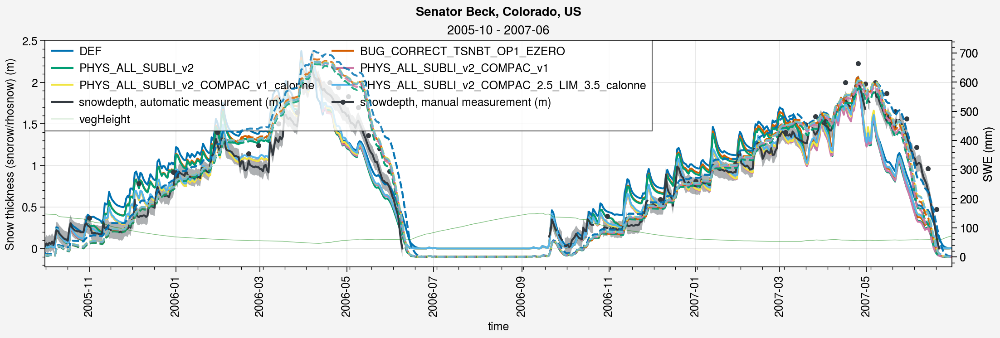

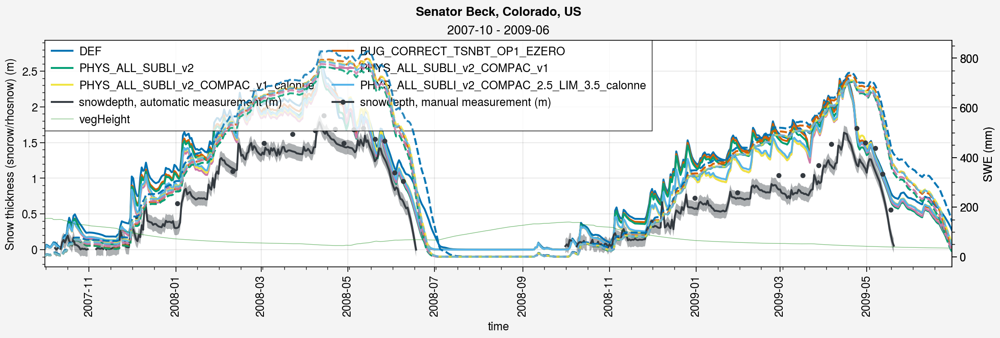

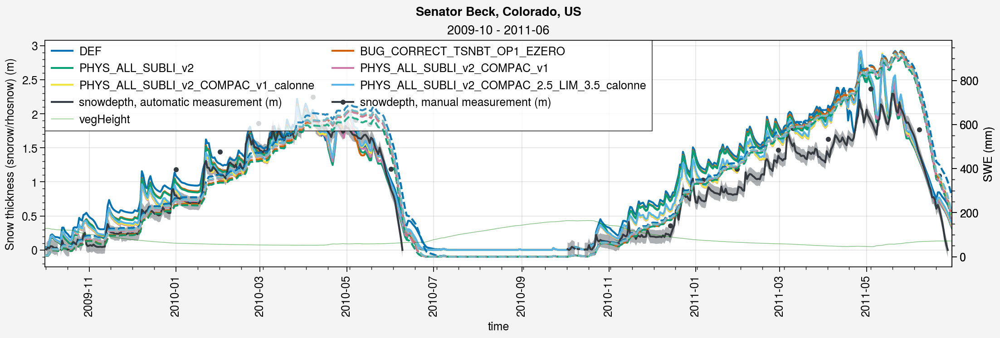

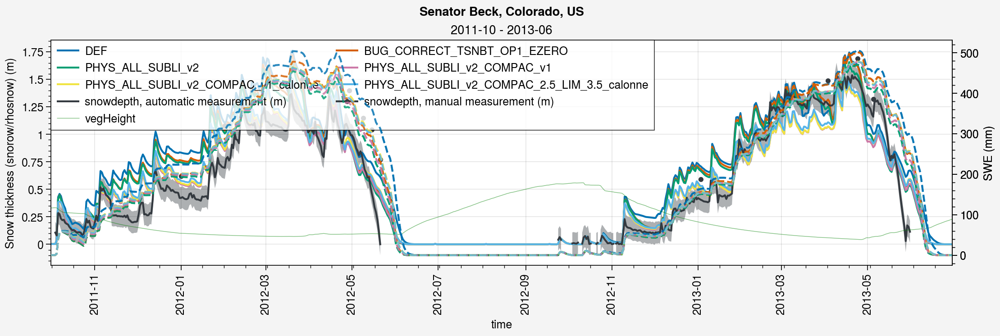

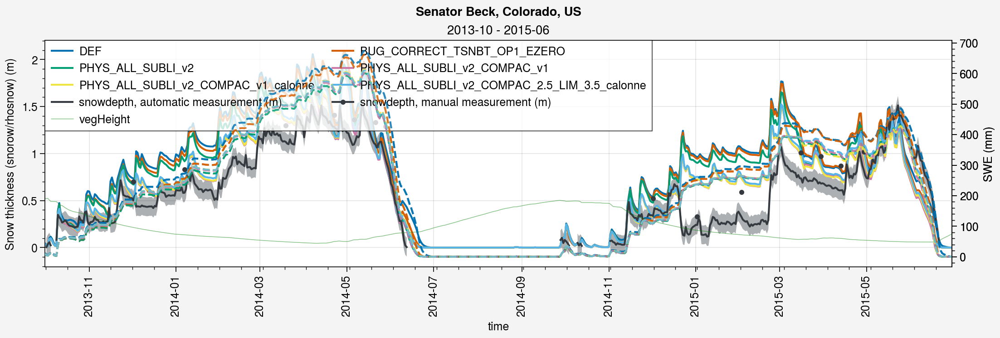

In [14]:
%matplotlib inline

color_obs = 'gray8'

for i in range(tot_year//gap):
    fig, axs = pplt.subplots(ncols=1, nrows=1, refaspect=4, refwidth=10)

    if i*gap+gap < tot_year:
        period=slice(str(years[i*gap])+'-10',str(years[i*gap+gap])+'-06')
    else:
        period=slice(str(years[i*gap])+'-10',str(years[-1])+'-06')
    
    # Simus
    ax2 = axs[0].twinx()
    ax2.format(ylabel='SWE (mm)')
    for ds_d, label in zip(ds_d_list, labels):
        axs[0].plot(ds_d.snd.sel(time=period), label=label)
        ax2.plot(ds_d.snw.sel(time=period), ls='--', alpha=0.8, label=f'{label} SWE')

    # SnowMIP
    # axs[0].plot(ds_paul_d.snd.sel(time=period), label=label_paul, color='red9')
    
    # Obs
    shadedata = np.concatenate((
        np.expand_dims(ds_d_eval_menard2019.snd_auto.sel(time=period).values+0.1, axis=0),
        np.expand_dims(ds_d_eval_menard2019.snd_auto.sel(time=period).values-0.1, axis=0),), axis=0)
    axs[0].plot(ds_d_eval_menard2019.snd_auto.sel(time=period), shadedata=shadedata, color=color_obs)
    axs[0].plot(ds_d_eval_menard2019.snd_man.sel(time=period), marker='.', color=color_obs)

    # Veg
    axs[0].plot(ds_d_list[0].vegHeight.sel(time=period), label='vegHeight', color='green', ls='-', lw=0.5, alpha=0.5)

    # Met
    # axs[0].plot(ds_d_met.Wind.sel(time=period)/10, label='0.1*Wind (m/s)', color='gray', ls='-', lw=0.5, alpha=0.5)
    
    axs[0].legend(loc='ul', ncols=2)
    axs[0].format(title=period.start+' - '+period.stop)
    
    fig.suptitle(site_longname)


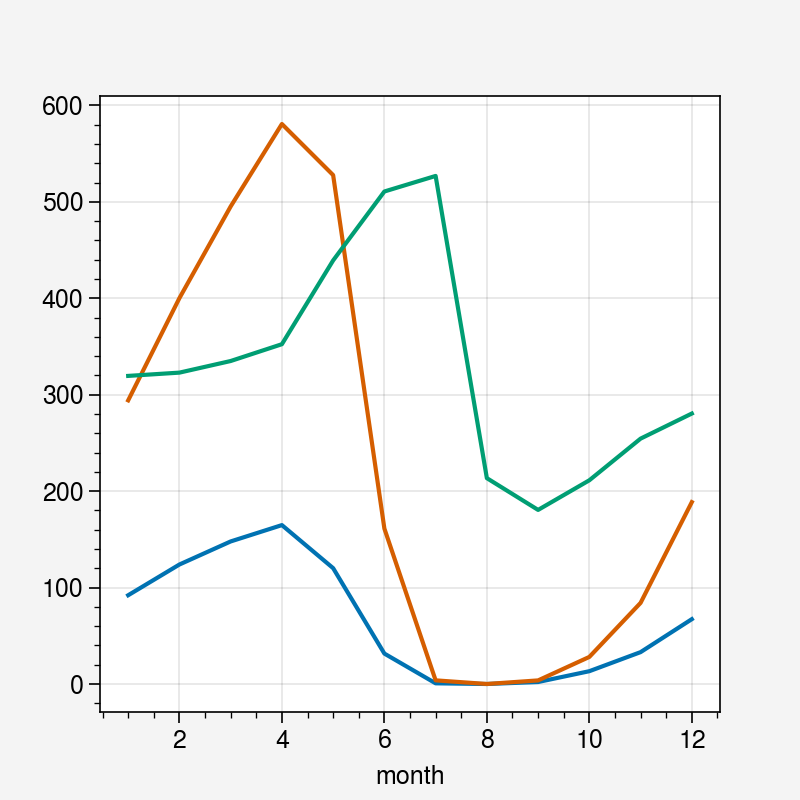

In [15]:
(ds_d.snd.groupby('time.month').mean()*100).plot()
ds_d.snw.groupby('time.month').mean().plot()
(ds_d.snw.groupby('time.month').mean() / ds_d.snd.groupby('time.month').mean()).plot()

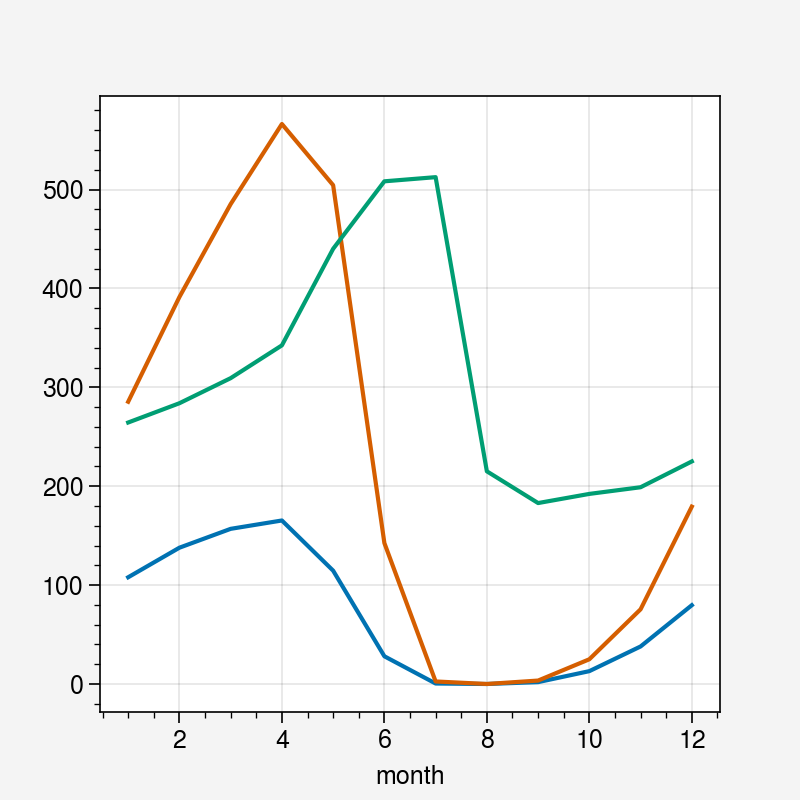

In [16]:
i = 2
(ds_d_list[i].snd.groupby('time.month').mean()*100).plot()
ds_d_list[i].snw.groupby('time.month').mean().plot()
(ds_d_list[i].snw.groupby('time.month').mean() / ds_d_list[i].snd.groupby('time.month').mean()).plot()

In [17]:
ds_d_eval_menard2019.snd_auto.groupby('time.dayofyear')

DataArrayGroupBy, grouped over 'dayofyear'
366 groups with labels 1, 2, 3, 4, 5, ..., 363, 364, 365, 366.

In [18]:
def fill_snowdepth_gaps(da, long_gap_days=50):
    """
    Fill snow-depth time series:
    - NaN gaps <= long_gap_days: linear interpolation
    - NaN gaps > long_gap_days: set to 0
    
    Intended for plotting seasonal cycles, not necessarily for metrics.
    """
    s = da.to_series().copy()
    is_nan = s.isna()

    # Identify consecutive NaN / non-NaN runs
    run_id = (is_nan != is_nan.shift(fill_value=False)).cumsum()

    s_filled = s.copy()

    for _, idx in s[is_nan].groupby(run_id[is_nan]).groups.items():
        gap_len = len(idx)

        if gap_len > long_gap_days:
            # Long summer-like missing period -> assume snow-free
            s_filled.loc[idx] = 0.0

    # Remaining shorter NaN gaps -> linear interpolation
    s_filled = s_filled.interpolate(method="time", limit_area="inside")

    return xr.DataArray(
        s_filled,
        dims=da.dims,
        coords=da.coords,
        attrs=da.attrs,
        name=da.name
    )

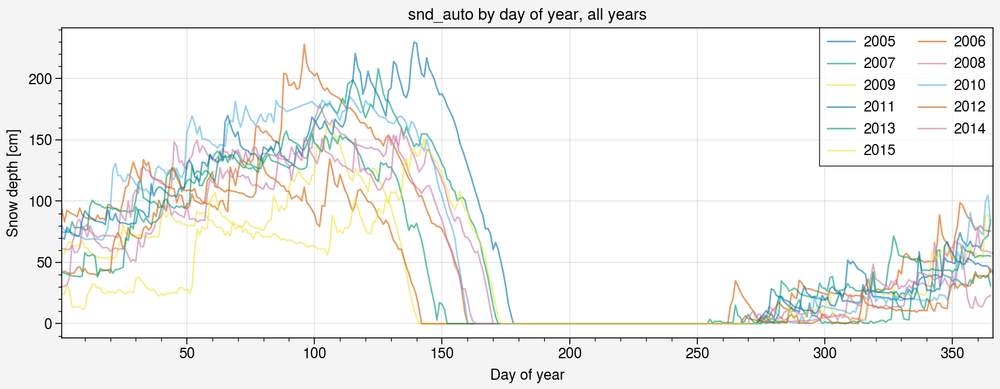

In [19]:
snd_filled = fill_snowdepth_gaps(
    ds_d_eval_menard2019.snd_auto,
    long_gap_days=50
)

fig, ax = pplt.subplots(refwidth=8, refaspect=3)

for year, da_y in snd_filled.groupby("time.year"):
    ax.plot(
        da_y.time.dt.dayofyear,
        da_y * 100,
        label=str(year),
        alpha=0.6,
        lw=1
    )

ax.format(
    xlabel="Day of year",
    ylabel="Snow depth [cm]",
    title="snd_auto by day of year, all years"
)
ax.legend(ncols=2, fontsize=8)

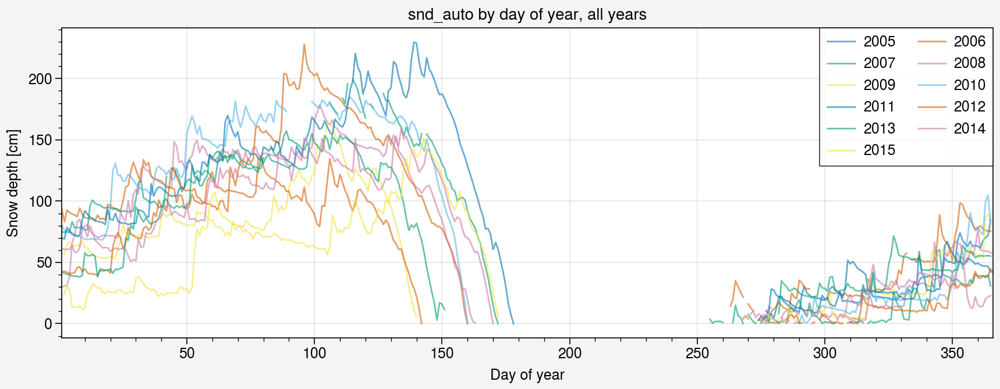

In [20]:
fig, ax = pplt.subplots(refwidth=8, refaspect=3)

for year, da_y in ds_d_eval_menard2019.snd_auto.groupby("time.year"):
    ax.plot(
        da_y.time.dt.dayofyear,
        da_y * 100,
        label=str(year),
        alpha=0.6,
        lw=1
    )

ax.format(
    xlabel="Day of year",
    ylabel="Snow depth [cm]",
    title="snd_auto by day of year, all years"
)
ax.legend(ncols=2, fontsize=8)

In [21]:
period = slice('2005-10-01', '2015-09-30', None)
mask_obs = ~ds_d_eval_menard2019.snd_auto.sel(time=period).isnull()

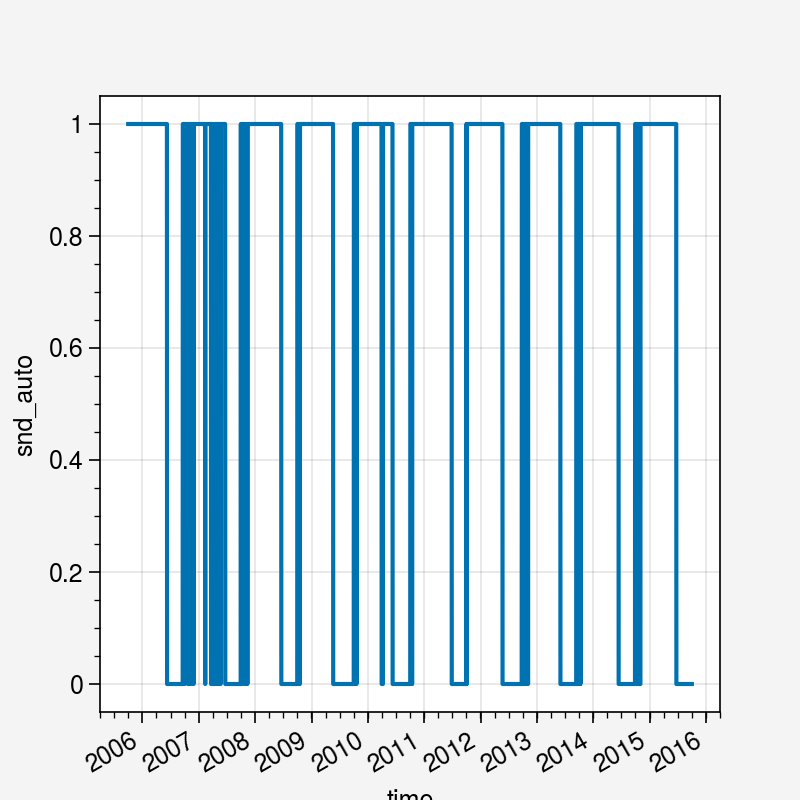

In [22]:
mask_obs.plot()

Text(0.5, 0.98, 'Senator Beck, Colorado, US')

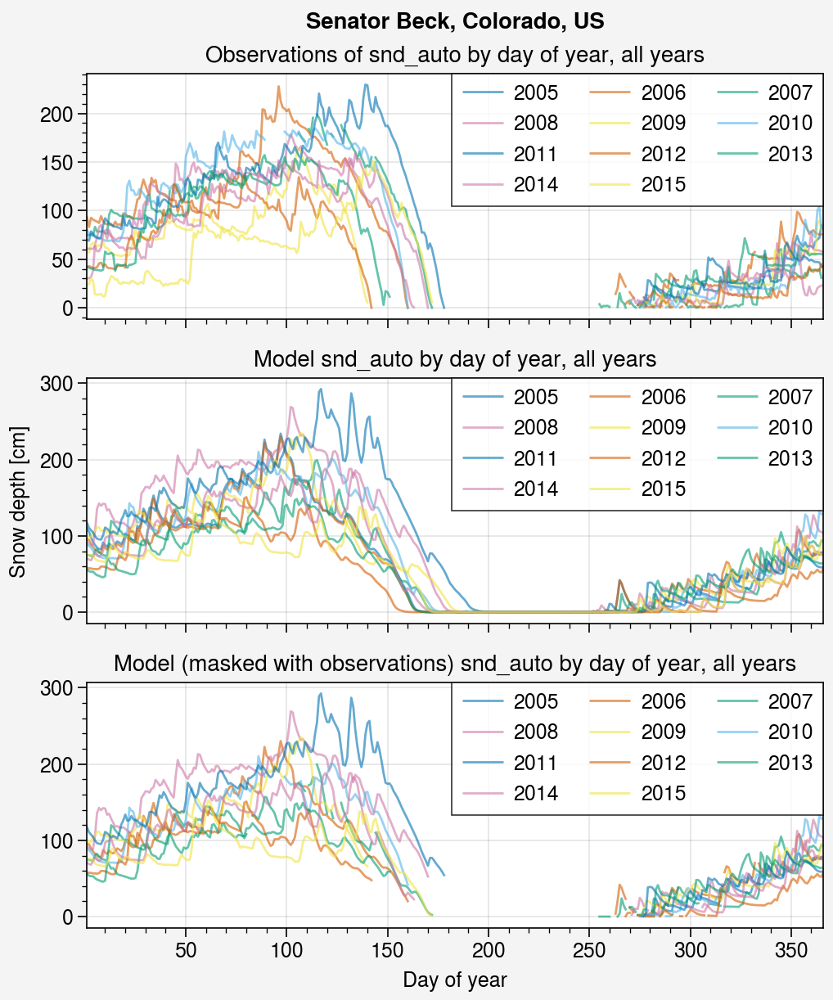

In [23]:
fig, axs = pplt.subplots(refwidth=4.5, refaspect=3, nrows=3)

ax = axs[0]
for year, da_y in ds_d_eval_menard2019.snd_auto.groupby("time.year"):
    ax.plot(
        da_y.time.dt.dayofyear,
        da_y * 100,
        label=str(year),
        alpha=0.6,
        lw=1
    )

ax.format(
    xlabel="Day of year",
    ylabel="Snow depth [cm]",
    title="Observations of snd_auto by day of year, all years"
)
ax.legend(ncols=3, fontsize=6)

ax = axs[1]
for year, da_y in ds_d.snd.groupby("time.year"):
    ax.plot(
        da_y.time.dt.dayofyear,
        da_y * 100,
        label=str(year),
        alpha=0.6,
        lw=1
    )

ax.format(
    xlabel="Day of year",
    ylabel="Snow depth [cm]",
    title="Model snd_auto by day of year, all years"
)
ax.legend(ncols=3, fontsize=6)

ax = axs[2]
for year, da_y in ds_d.snd.where(mask_obs).groupby("time.year"):
    ax.plot(
        da_y.time.dt.dayofyear,
        da_y * 100,
        label=str(year),
        alpha=0.6,
        lw=1
    )

ax.format(
    xlabel="Day of year",
    ylabel="Snow depth [cm]",
    title="Model (masked with observations) snd_auto by day of year, all years"
)
ax.legend(ncols=3, fontsize=6)

fig.suptitle(site_longname)

In [31]:
def fill_snowdepth_gaps(da, long_gap_days=50):
    """
    Fill snow-depth time series for annual-cycle visualization:
    - NaN gaps <= long_gap_days: linear interpolation
    - NaN gaps > long_gap_days: set to 0

    Not used for computation of evaluation metrics.
    """
    s = da.to_series().copy()
    is_nan = s.isna()

    # Identify consecutive NaN / non-NaN runs
    run_id = (is_nan != is_nan.shift(fill_value=False)).cumsum()

    s_filled = s.copy()

    for _, idx in s[is_nan].groupby(run_id[is_nan]).groups.items():
        gap_len = len(idx)

        if gap_len > long_gap_days:
            # Long summer-like missing period -> assume snow-free
            s_filled.loc[idx] = 0.0

    # Remaining shorter NaN gaps -> linear interpolation
    s_filled = s_filled.interpolate(method="time", limit_area="inside")

    return xr.DataArray(
        s_filled,
        dims=da.dims,
        coords=da.coords,
        attrs=da.attrs,
        name=da.name
    )

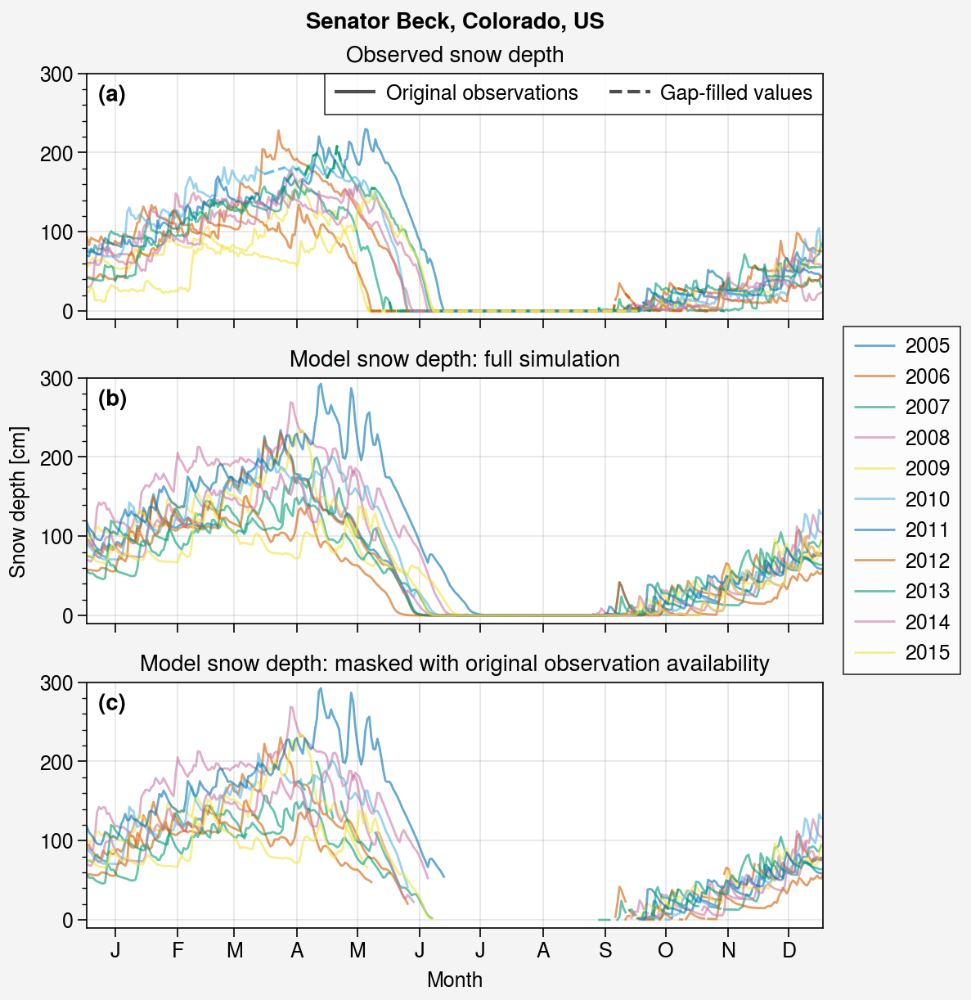

In [32]:
# Month positions for a standard non-shifted day-of-year axis
month_ticks = [
    15,   # Jan
    46,   # Feb
    74,   # Mar
    105,  # Apr
    135,  # May
    166,  # Jun
    196,  # Jul
    227,  # Aug
    258,  # Sep
    288,  # Oct
    319,  # Nov
    349   # Dec
]

month_labels = [
    "J", "F", "M", "A", "M", "J",
    "J", "A", "S", "O", "N", "D"
]


fig, axs = pplt.subplots(
    refwidth=4.5,
    refaspect=3,
    nrows=3
)

# =====================================================================
# (a) ORIGINAL OBSERVATIONS + GAP-FILLED VALUES
# =====================================================================

ax = axs[0]

for year, da_y in ds_d_eval_menard2019.snd_auto.groupby("time.year"):

    # Filled version used only for annual-cycle visualization
    da_y_filled = fill_snowdepth_gaps(
        da_y,
        long_gap_days=50
    )

    # Original observations
    line = ax.plot(
        da_y.time.dt.dayofyear,
        da_y * 100,
        alpha=0.6,
        lw=1,
        label="_nolegend_"
    )[0]

    color = line.get_color()

    # Values introduced by gap filling
    filled_mask = (
        da_y.isnull()
        & da_y_filled.notnull()
    )

    # Add one original point on each side so dashed lines connect
    # visually with the observations
    filled_plot_mask = (
        filled_mask
        | filled_mask.shift(time=1, fill_value=False)
        | filled_mask.shift(time=-1, fill_value=False)
    )

    ax.plot(
        da_y.time.dt.dayofyear,
        da_y_filled.where(filled_plot_mask) * 100,
        color=color,
        ls="--",
        alpha=0.9,
        lw=1.2,
        label="_nolegend_"
    )


# Dummy lines for line-style legend
ax.plot(
    [],
    [],
    color="0.3",
    lw=1.5,
    ls="-",
    label="Original observations"
)

ax.plot(
    [],
    [],
    color="0.3",
    lw=1.5,
    ls="--",
    label="Gap-filled values"
)

ax.format(
    ylabel="Snow depth [cm]",
    title="Observed snow depth"
)

ax.legend(
    ncols=2,
    fontsize=7,
    loc="ur"
)


# =====================================================================
# (b) FULL MODEL SIMULATION
# =====================================================================

ax = axs[1]

year_handles = []
year_labels = []

for year, da_y in ds_d.snd.groupby("time.year"):

    h = ax.plot(
        da_y.time.dt.dayofyear,
        da_y * 100,
        alpha=0.6,
        lw=1,
        label=str(year)
    )

    year_handles += h
    year_labels.append(str(year))

ax.format(
    ylabel="Snow depth [cm]",
    title="Model snow depth: full simulation"
)


# =====================================================================
# (c) MODEL MASKED WITH ORIGINAL OBSERVATION AVAILABILITY
# =====================================================================

ax = axs[2]

for year, da_y in ds_d.snd.where(mask_obs).groupby("time.year"):

    ax.plot(
        da_y.time.dt.dayofyear,
        da_y * 100,
        alpha=0.6,
        lw=1,
        label="_nolegend_"
    )

ax.format(
    ylabel="Snow depth [cm]",
    title="Model snow depth: masked with original observation availability"
)


# =====================================================================
# COMMON FORMATTING
# =====================================================================

axs.format(
    abc="(a)",
    abcloc="ul",

    # Slightly below zero so gap-filled zero values remain visible
    ylim=(-10, 300),
    yticks=[0, 100, 200, 300],

    xlim=(1, 366),

    # Months instead of DOY
    xticks=month_ticks,
    xticklabels=month_labels,
    xtickminor=False
)

# No x labels for upper panels
axs[0].format(xlabel="")
axs[1].format(xlabel="")

# Bottom axis
axs[2].format(
    xlabel="Month"
)

fig.suptitle(site_longname)


# =====================================================================
# YEAR LEGEND — ONCE, TO THE RIGHT OF THE WHOLE FIGURE
# =====================================================================

fig.legend(
    year_handles,
    labels=year_labels,
    loc="r",
    ncols=1,
    fontsize=7
)

fig.save("img/review_snb_snowdepth_gapfilling.png")

In [84]:
ds_d_eval_menard2019

<xarray.Dataset>
Dimensions:   (sdepth: 3, time: 3653)
Coordinates:
  * sdepth    (sdepth) float32 0.1 0.2 0.25
  * time      (time) datetime64[ns] 2005-10-01 2005-10-02 ... 2015-10-01
Data variables:
    albs      (time) float32 0.5912 0.2855 0.21 0.1991 ... 0.2173 0.216 nan
    snd_auto  (time) float32 0.026 0.061 0.041 0.069 0.053 ... nan nan nan nan
    snd_man   (time) float32 nan nan nan nan nan nan ... nan nan nan nan nan nan
    snw_man   (time) float32 nan nan nan nan nan nan ... nan nan nan nan nan nan
    ts        (time) float32 nan nan nan nan nan nan ... nan nan nan nan nan nan
    tsl       (time, sdepth) float32 3.364 3.915 4.099 3.25 ... nan nan nan

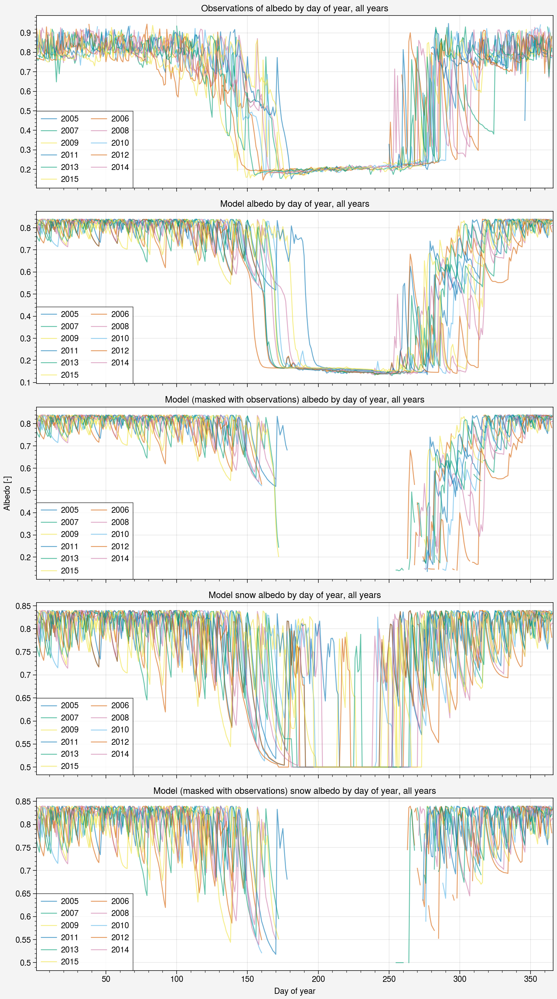

In [86]:
fig, axs = pplt.subplots(refwidth=8, refaspect=3, nrows=5)

ax = axs[0]
for year, da_y in ds_d_eval_menard2019.albs.groupby("time.year"):
    ax.plot(
        da_y.time.dt.dayofyear,
        da_y,
        label=str(year),
        alpha=0.6,
        lw=1
    )

ax.format(
    xlabel="Day of year",
    ylabel="Albedo [-]",
    title="Observations of albedo by day of year, all years"
)
ax.legend(ncols=2, fontsize=8)

ax = axs[1]
for year, da_y in ds_d.albs.groupby("time.year"):
    ax.plot(
        da_y.time.dt.dayofyear,
        da_y,
        label=str(year),
        alpha=0.6,
        lw=1
    )

ax.format(
    xlabel="Day of year",
    ylabel="Albedo [-]",
    title="Model albedo by day of year, all years"
)
ax.legend(ncols=2, fontsize=8)

ax = axs[2]
for year, da_y in ds_d.albs.where(mask_obs).groupby("time.year"):
    ax.plot(
        da_y.time.dt.dayofyear,
        da_y,
        label=str(year),
        alpha=0.6,
        lw=1
    )

ax.format(
    xlabel="Day of year",
    ylabel="Albedo [-]",
    title="Model (masked with observations) albedo by day of year, all years"
)
ax.legend(ncols=2, fontsize=8)


ax = axs[3]
for year, da_y in ds_d.albsn.groupby("time.year"):
    ax.plot(
        da_y.time.dt.dayofyear,
        da_y,
        label=str(year),
        alpha=0.6,
        lw=1
    )

ax.format(
    xlabel="Day of year",
    ylabel="Albedo [-]",
    title="Model snow albedo by day of year, all years"
)
ax.legend(ncols=2, fontsize=8)

ax = axs[4]
for year, da_y in ds_d.albsn.where(mask_obs).groupby("time.year"):
    ax.plot(
        da_y.time.dt.dayofyear,
        da_y,
        label=str(year),
        alpha=0.6,
        lw=1
    )

ax.format(
    xlabel="Day of year",
    ylabel="Albedo [-]",
    title="Model (masked with observations) snow albedo by day of year, all years"
)
ax.legend(ncols=2, fontsize=8)

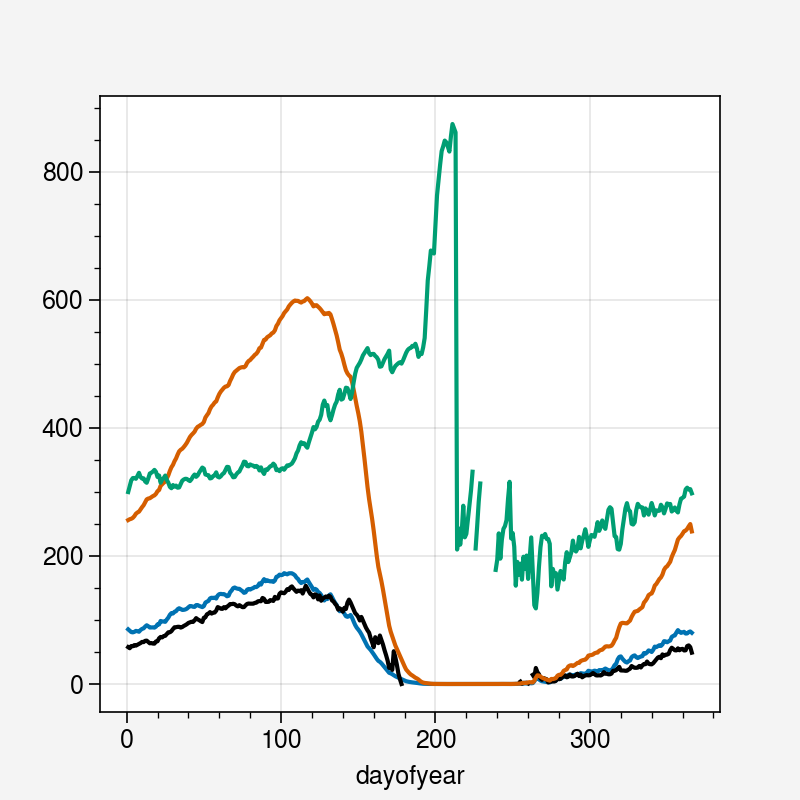

In [ ]:
(ds_d.snd.groupby('time.dayofyear').mean()*100).plot()
(ds_d_eval_menard2019.snd_auto.groupby('time.dayofyear').mean()*100).plot(c='k')
ds_d.snw.groupby('time.dayofyear').mean().plot()
(ds_d.snw.groupby('time.dayofyear').mean() / ds_d.snd.groupby('time.dayofyear').mean()).plot()

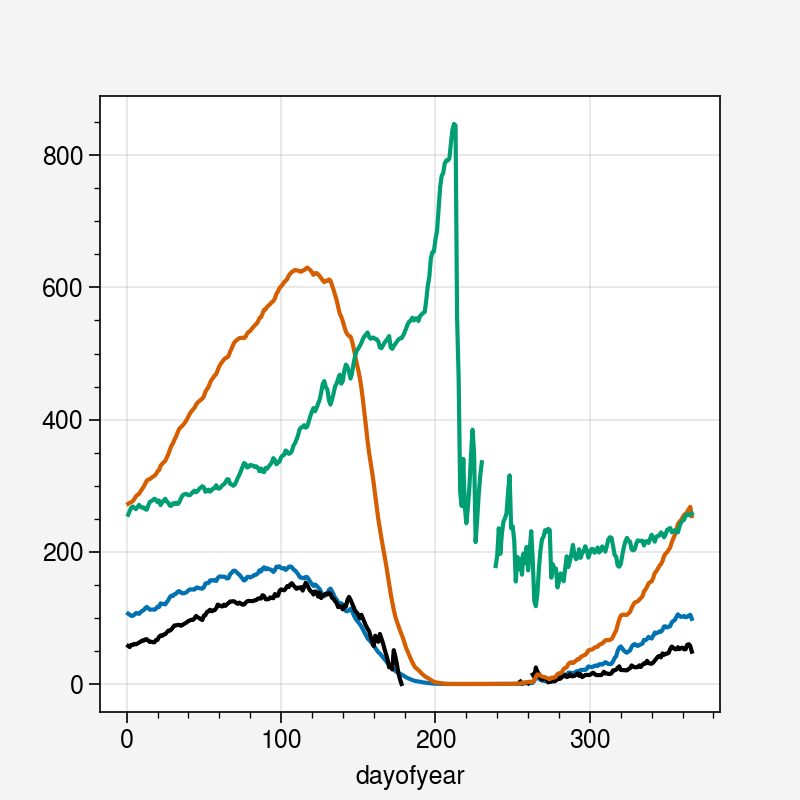

In [65]:
i = 0
(ds_d_list[i].snd.groupby('time.dayofyear').mean()*100).plot()
(ds_d_eval_menard2019.snd_auto.groupby('time.dayofyear').mean()*100).plot(c='k')
ds_d_list[i].snw.groupby('time.dayofyear').mean().plot()
(ds_d_list[i].snw.groupby('time.dayofyear').mean() / ds_d_list[i].snd.groupby('time.dayofyear').mean()).plot()

In [35]:
ds_d.snd.groupby('time.month').mean()

<xarray.DataArray 'snd' (month: 12)>
array([9.20668705e-01, 1.23930936e+00, 1.47849872e+00, 1.64802204e+00,
       1.20139647e+00, 3.15598473e-01, 7.19755896e-03, 1.16545815e-04,
       2.07379930e-02, 1.32917974e-01, 3.30625006e-01, 6.72457157e-01])
Coordinates:
  * month    (month) int64 1 2 3 4 5 6 7 8 9 10 11 12
Attributes:
    long_name:   Snow thickness (snorow/rhosnow)
    units:       m
    nameInCode:  snd_d

In [37]:
ds_d.snw.groupby('time.month').mean()

<xarray.DataArray 'snw' (month: 12)>
array([2.94176480e+02, 4.00203144e+02, 4.95247505e+02, 5.80765905e+02,
       5.27756407e+02, 1.61197654e+02, 3.79238305e+00, 2.48817910e-02,
       3.74423640e+00, 2.80837526e+01, 8.41362441e+01, 1.88619269e+02])
Coordinates:
  * month    (month) int64 1 2 3 4 5 6 7 8 9 10 11 12
Attributes:
    long_name:   The mass of surface snow on the land portion of the grid cel...
    units:       kg/m$^2$
    nameInCode:  snoacc_d

In [39]:
(ds_d.snw.groupby('time.month').mean() / ds_d.snd.groupby('time.month').mean()) 

<xarray.DataArray (month: 12)>
array([319.5247957 , 322.92432936, 334.96647587, 352.4017828 ,
       439.28579791, 510.76816647, 526.89850394, 213.49364632,
       180.54960294, 211.28634202, 254.47634803, 280.49261901])
Coordinates:
  * month    (month) int64 1 2 3 4 5 6 7 8 9 10 11 12

### SWE

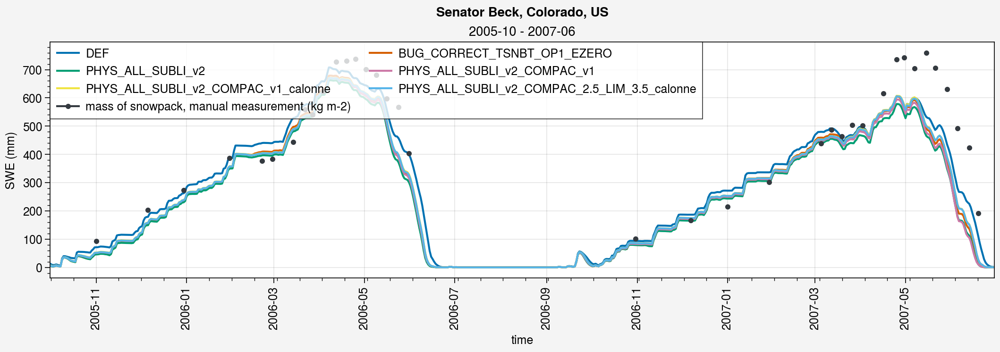

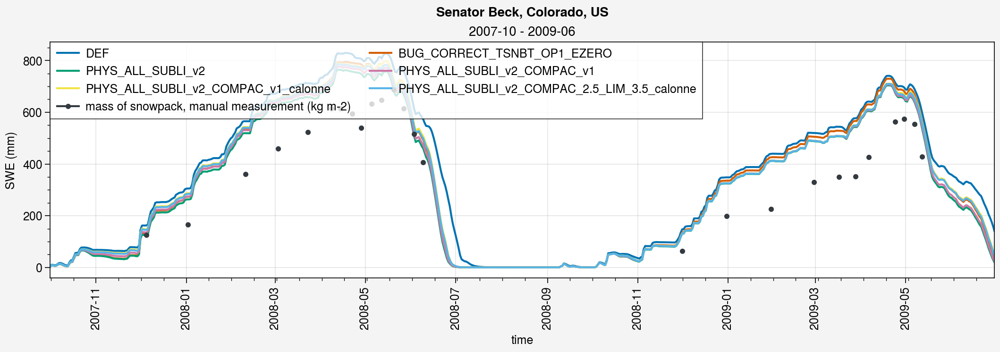

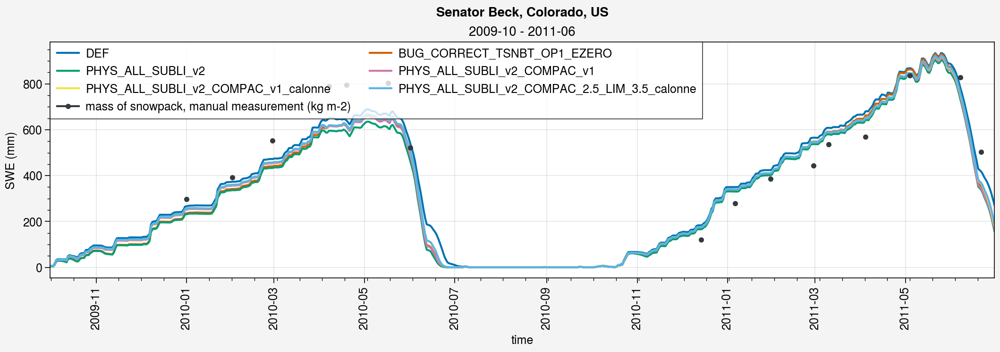

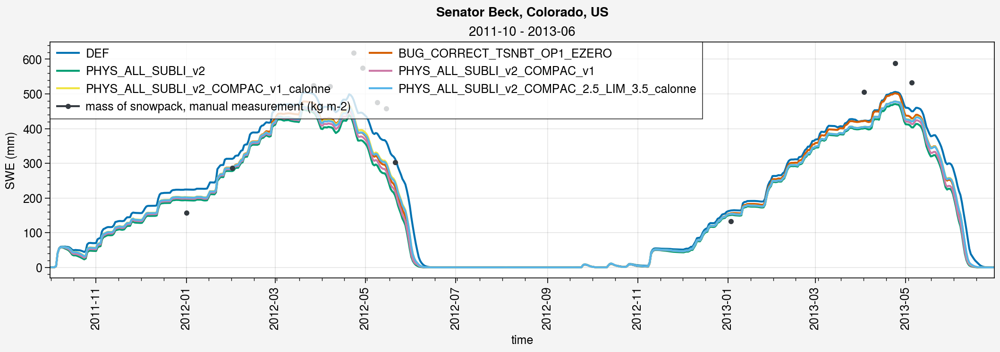

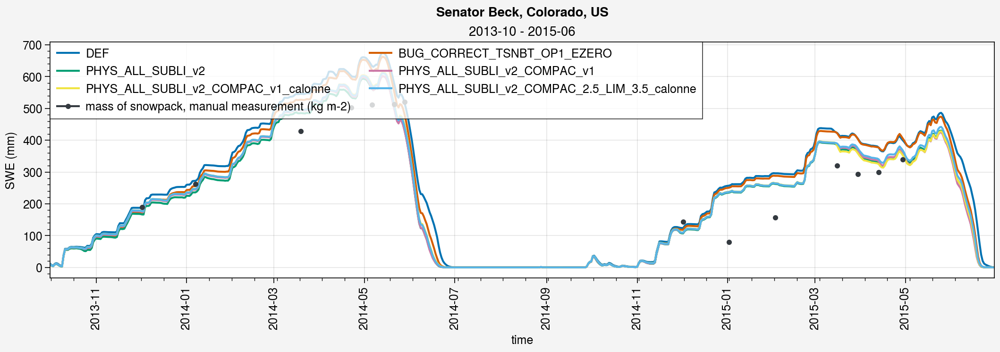

In [21]:
%matplotlib inline

color_obs = 'gray8'

for i in range(tot_year//gap):
    fig, axs = pplt.subplots(ncols=1, nrows=1, refaspect=4, refwidth=10)

    if i*gap+gap < tot_year:
        period=slice(str(years[i*gap])+'-10',str(years[i*gap+gap])+'-06')
    else:
        period=slice(str(years[i*gap])+'-10',str(years[-1])+'-06')
    
    # Simus
    for ds_d, label in zip(ds_d_list, labels):
        axs[0].plot(ds_d.snw.sel(time=period), label=label)

    # SnowMIP
    # axs[0].plot(ds_paul_d.snw.sel(time=period), label=label_paul, color='red9')
    
    # Obs
    # shadedata = np.concatenate((
    #     np.expand_dims(ds_d_eval_menard2019.snw_auto.sel(time=period).values+25, axis=0),
    #     np.expand_dims(ds_d_eval_menard2019.snw_auto.sel(time=period).values-25, axis=0),), axis=0)
    # axs[0].plot(ds_d_eval_menard2019.snw_auto.sel(time=period), shadedata=shadedata, color=color_obs)
    axs[0].plot(ds_d_eval_menard2019.snw_man.sel(time=period), marker='.', color=color_obs)
    
    axs[0].legend(loc='ul', ncols=2)
    axs[0].format(title=period.start+' - '+period.stop, ylabel='SWE (mm)')
    
    fig.suptitle(site_longname)


### Albedo

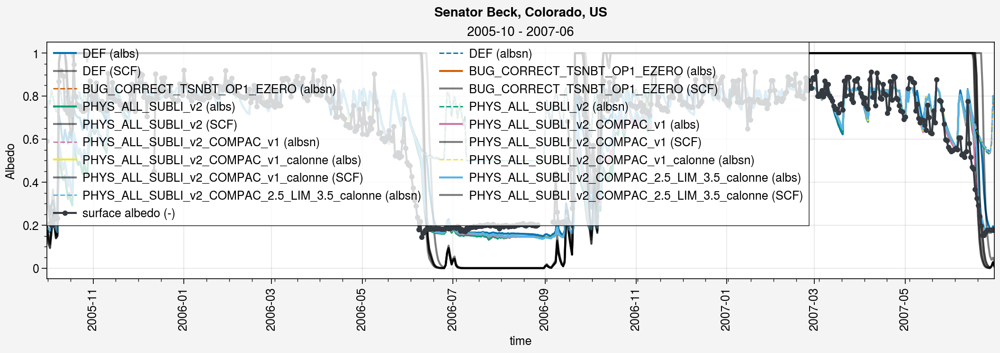

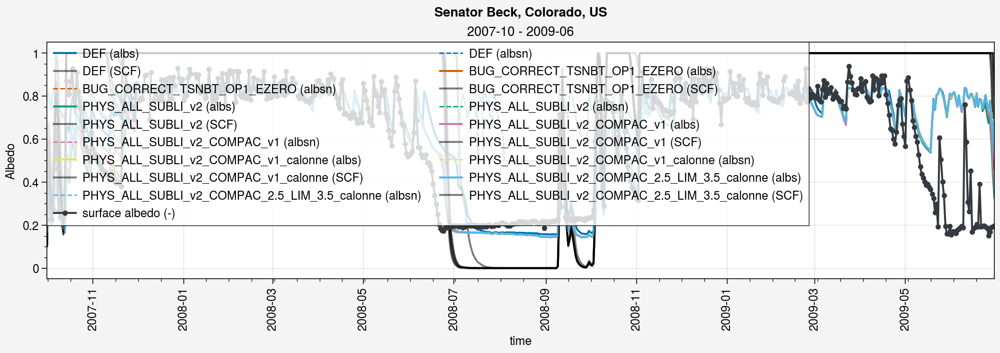

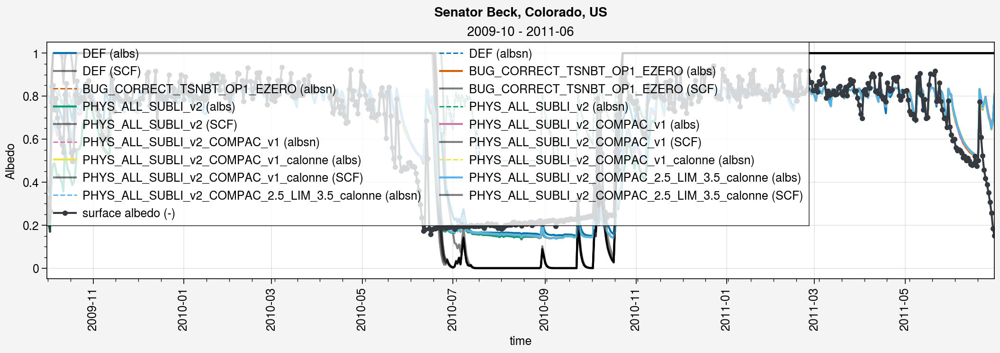

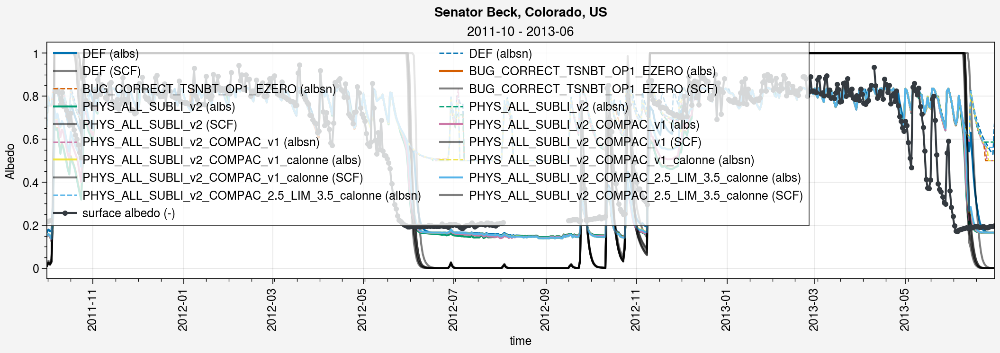

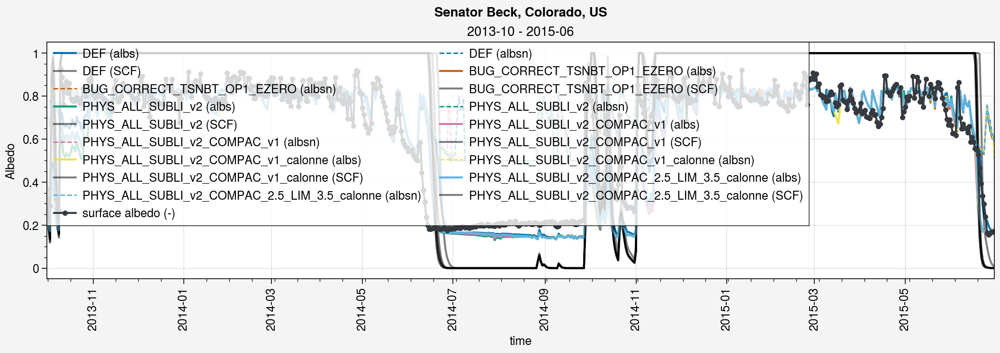

In [22]:
%matplotlib inline
gap = 2
color_obs = 'gray8'

for i in range(tot_year//gap):
    fig, axs = pplt.subplots(ncols=1, nrows=1, refaspect=4, refwidth=10)

    if i*gap+gap < tot_year:
        period=slice(str(years[i*gap])+'-10',str(years[i*gap+gap])+'-06')
    else:
        period=slice(str(years[i*gap])+'-10',str(years[-1])+'-06')
    
    # Simus
    k = 0
    for ds_d, label in zip(ds_d_list, labels):
        axs[0].plot(ds_d.albs.sel(time=period), label=label+' (albs)', color='C'+str(k))
        axs[0].plot(ds_d.albsn.sel(time=period), label=label+' (albsn)', color='C'+str(k), ls='--', lw=1)
        axs[0].plot(ds_d.snc.sel(time=period), label=label+' (SCF)', color='k', alpha=0.5)
        
        k+=1

    # SnowMIP
    # axs[0].plot(ds_paul_d.albs.sel(time=period), label=label_paul+' (albs)', color='red9')
    # axs[0].plot(ds_paul_d.albsn.sel(time=period), label=label_paul+' (albsn)', color='red9', ls='--', lw=1)
    # axs[0].plot(ds_paul_d.snc.sel(time=period), label=label_paul+' (SCF)', color='gray6', alpha=0.5)
    
    # Obs
    axs[0].plot(ds_d_eval_menard2019.albs.sel(time=period), marker='.', color=color_obs)
    
    axs[0].legend(loc='ul', ncols=2)
    axs[0].format(title=period.start+' - '+period.stop, ylabel='Albedo')
    
    fig.suptitle(site_longname)


### Surface Temperature

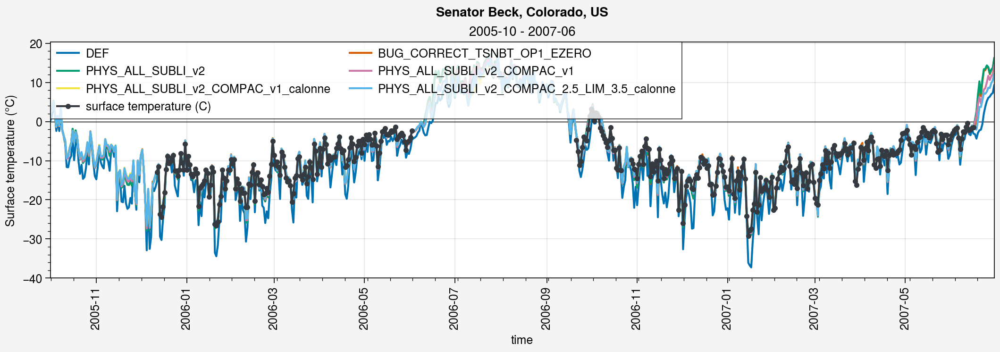

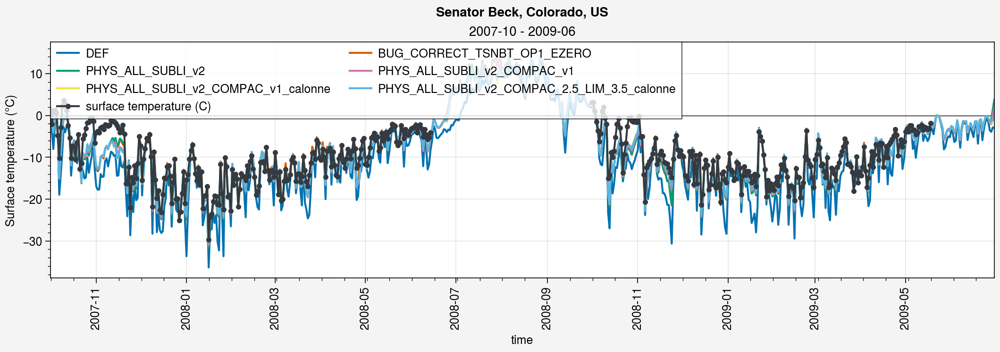

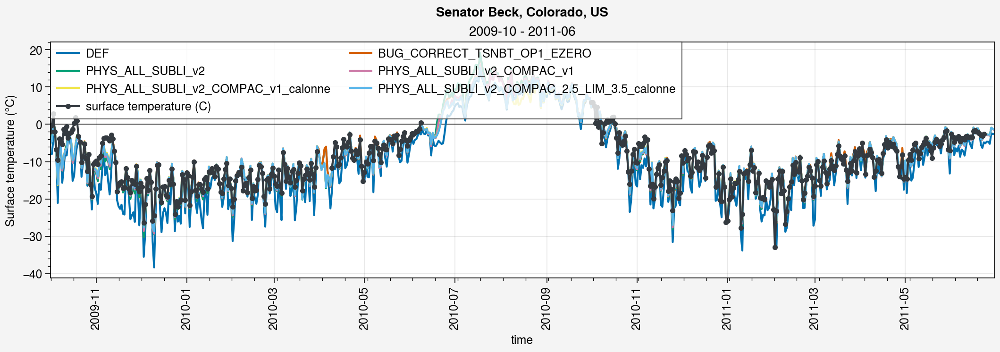

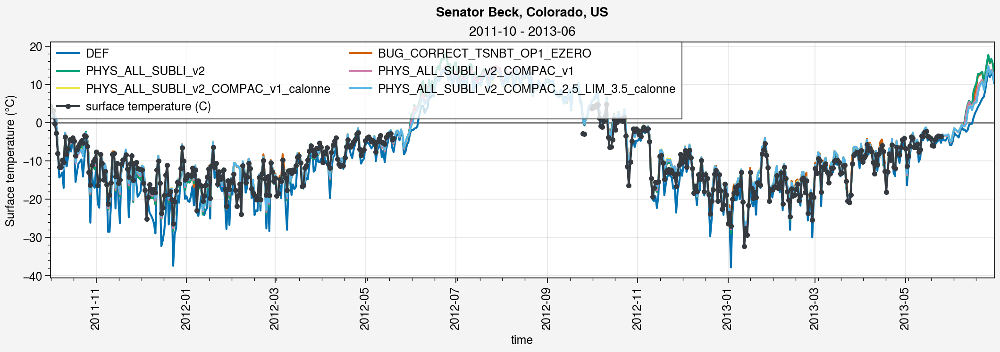

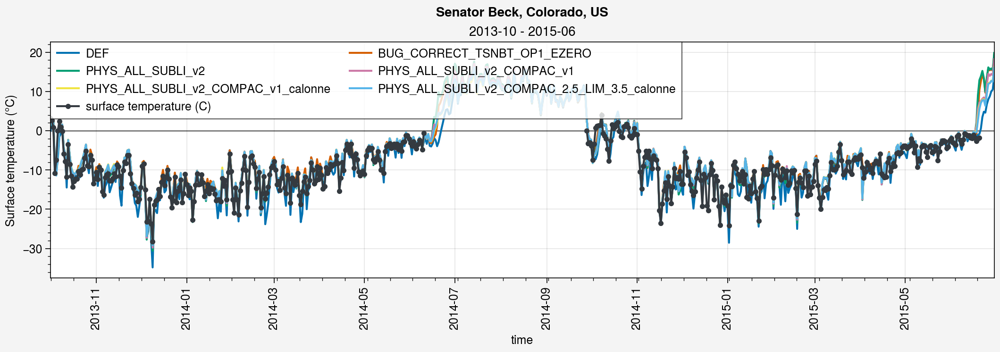

In [23]:
%matplotlib inline
gap = 2
color_obs = 'gray8'

for i in range(tot_year//gap):
    fig, axs = pplt.subplots(ncols=1, nrows=1, refaspect=4, refwidth=10)

    if i*gap+gap < tot_year:
        period=slice(str(years[i*gap])+'-10',str(years[i*gap+gap])+'-06')
    else:
        period=slice(str(years[i*gap])+'-10',str(years[-1])+'-06')
    
    # Simus
    for ds_d, label in zip(ds_d_list, labels):
        axs[0].plot(ds_d.ts.sel(time=period)-273.15, label=label)

    # SnowMIP
    # axs[0].plot(ds_paul_d.ts.sel(time=period)-273.15, label=label_paul, color='red9')
    
    # Obs
    axs[0].plot(ds_d_eval_menard2019.ts.sel(time=period), marker='.', color=color_obs)
    axs[0].hlines(0, ds_d.ts.sel(time=period).time[0], ds_d.ts.sel(time=period).time[-1], c='k', lw=1, alpha=0.5)
    
    axs[0].legend(loc='ul', ncols=2)
    axs[0].format(title=period.start+' - '+period.stop, ylabel='Surface temperature (°C)')
    
    fig.suptitle(site_longname)


### Soil Temperature

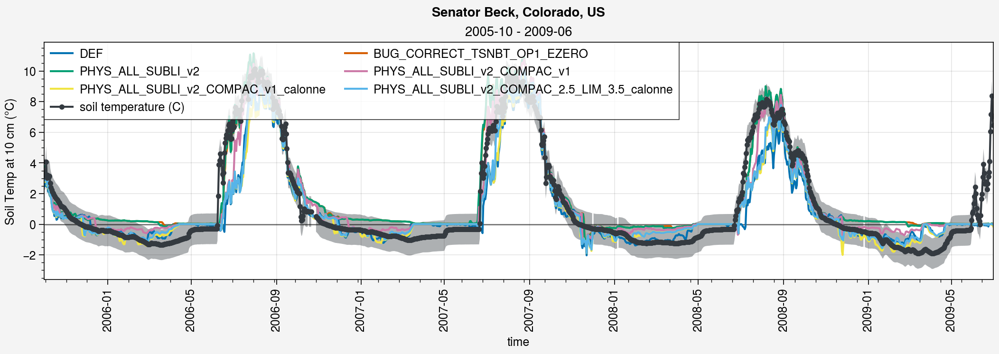

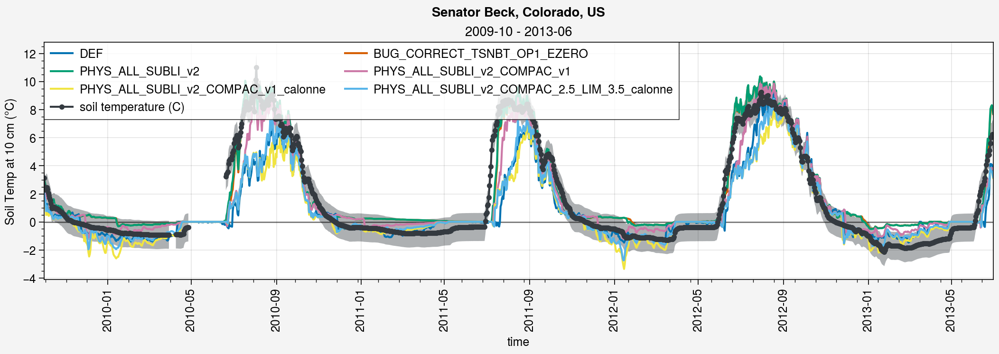

In [24]:
%matplotlib inline
gap = 4
color_obs = 'gray8'

for i in range(tot_year//gap):
    fig, axs = pplt.subplots(ncols=1, nrows=1, refaspect=4, refwidth=10)

    if i*gap+gap < tot_year:
        period=slice(str(years[i*gap])+'-10',str(years[i*gap+gap])+'-06')
    else:
        period=slice(str(years[i*gap])+'-10',str(years[-1])+'-06')
    
    # Simus
    for ds_d, label in zip(ds_d_list, labels):
        # axs[0].plot(((ds_d.tsl.sel(time=period, layer=1)+ds_d.tsl.sel(time=period, layer=2))/2)-273.15, label=label)
        # axs[0].plot(((ds_d.tsl.sel(time=period).isel(layer=0)+ds_d.tsl.sel(time=period).isel(layer=1))/2)-273.15, label=label)
        axs[0].plot(ds_d.tsl.sel(time=period).interp(layer=ds_d_eval_menard2019.sdepth.values).sel(layer=0.1)-273.15, label=label)
    # axs[0].plot(((0.6*ds_paul_d['tsl:1'].sel(time=period)+0.4*ds_paul_d['tsl:2'].sel(time=period)))-273.15, label=label_paul, color='red9')
    # axs[0].plot(ds_paul_d.tsl.sel(time=period).interp(layer=ds_d_eval_menard2019.sdepth.values).sel(layer=0.1)-273.15, label=label_paul, color='red9')
        
    # Obs
    shadedata = np.concatenate((
        np.expand_dims(ds_d_eval_menard2019.tsl.sel(time=period, sdepth=0.1)+1, axis=0),
        np.expand_dims(ds_d_eval_menard2019.tsl.sel(time=period, sdepth=0.1)-1, axis=0),), axis=0)
    axs[0].plot(ds_d_eval_menard2019.tsl.sel(time=period, sdepth=0.1), shadedata=shadedata, marker='.', color=color_obs)
    
    axs[0].hlines(0, ds_d.tsl.sel(time=period).time[0], ds_d.tsl.sel(time=period).time[-1], c='k', lw=1, alpha=0.5)
    axs[0].legend(loc='ul', ncols=2)
    axs[0].format(title=period.start+' - '+period.stop, ylabel='Soil Temp at 10 cm (°C)')
    
    fig.suptitle(site_longname)


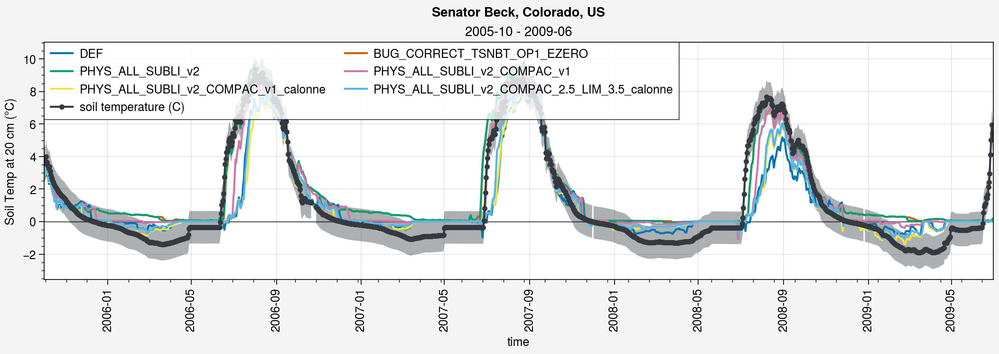

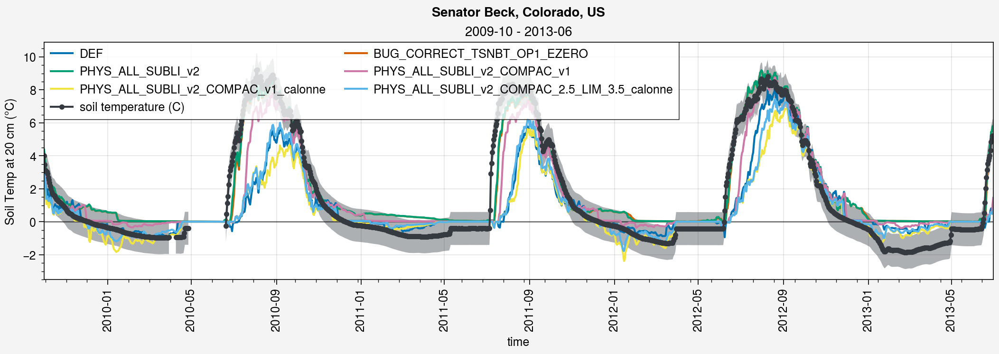

In [25]:
%matplotlib inline

color_obs = 'gray8'

for i in range(tot_year//gap):
    fig, axs = pplt.subplots(ncols=1, nrows=1, refaspect=4, refwidth=10)

    if i*gap+gap < tot_year:
        period=slice(str(years[i*gap])+'-10',str(years[i*gap+gap])+'-06')
    else:
        period=slice(str(years[i*gap])+'-10',str(years[-1])+'-06')
    
    # Simus
    for ds_d, label in zip(ds_d_list, labels):
        # axs[0].plot(((ds_d.tsl.sel(time=period, layer=1)+ds_d.tsl.sel(time=period, layer=2))/2)-273.15, label=label)
        # axs[0].plot(((ds_d.tsl.sel(time=period).isel(layer=0)+ds_d.tsl.sel(time=period).isel(layer=1))/2)-273.15, label=label)
        axs[0].plot(ds_d.tsl.sel(time=period).interp(layer=ds_d_eval_menard2019.sdepth.values).sel(layer=0.2)-273.15, label=label)
    # axs[0].plot(((0.6*ds_paul_d['tsl:1'].sel(time=period)+0.4*ds_paul_d['tsl:2'].sel(time=period)))-273.15, label=label_paul, color='red9')
    # axs[0].plot(ds_paul_d.tsl.sel(time=period).interp(layer=ds_d_eval_menard2019.sdepth.values).sel(layer=0.2)-273.15, label=label_paul, color='red9')
        
    # Obs
    shadedata = np.concatenate((
        np.expand_dims(ds_d_eval_menard2019.tsl.sel(time=period, sdepth=0.2)+1, axis=0),
        np.expand_dims(ds_d_eval_menard2019.tsl.sel(time=period, sdepth=0.2)-1, axis=0),), axis=0)
    axs[0].plot(ds_d_eval_menard2019.tsl.sel(time=period, sdepth=0.2), shadedata=shadedata, marker='.', color=color_obs)
    
    axs[0].hlines(0, ds_d.tsl.sel(time=period).time[0], ds_d.tsl.sel(time=period).time[-1], c='k', lw=1, alpha=0.5)
    axs[0].legend(loc='ul', ncols=2)
    axs[0].format(title=period.start+' - '+period.stop, ylabel='Soil Temp at 20 cm (°C)')
    
    fig.suptitle(site_longname)


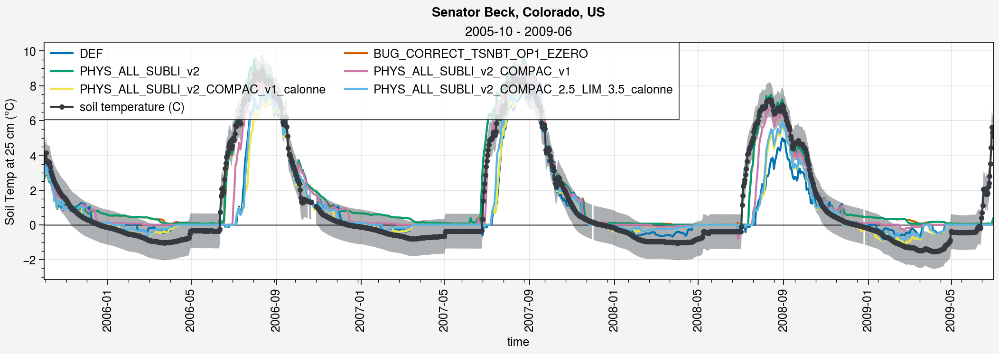

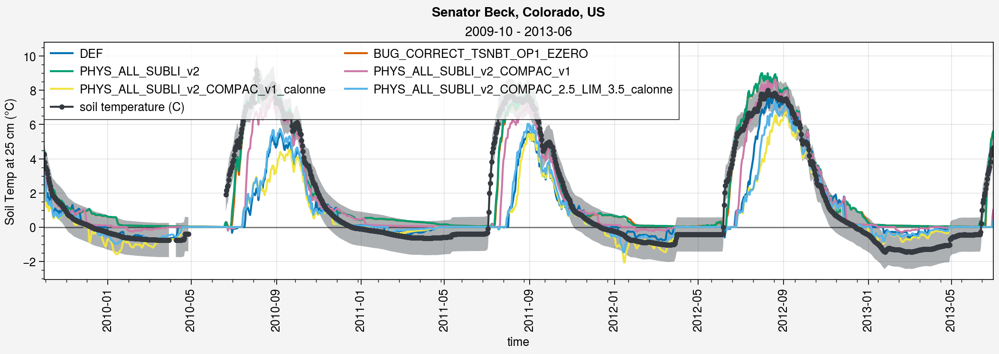

In [26]:
%matplotlib inline

color_obs = 'gray8'

for i in range(tot_year//gap):
    fig, axs = pplt.subplots(ncols=1, nrows=1, refaspect=4, refwidth=10)

    if i*gap+gap < tot_year:
        period=slice(str(years[i*gap])+'-10',str(years[i*gap+gap])+'-06')
    else:
        period=slice(str(years[i*gap])+'-10',str(years[-1])+'-06')
    
    # Simus
    for ds_d, label in zip(ds_d_list, labels):
        # axs[0].plot(((ds_d.tsl.sel(time=period, layer=1)+ds_d.tsl.sel(time=period, layer=2))/2)-273.15, label=label)
        # axs[0].plot(((ds_d.tsl.sel(time=period).isel(layer=0)+ds_d.tsl.sel(time=period).isel(layer=1))/2)-273.15, label=label)
        axs[0].plot(ds_d.tsl.sel(time=period).interp(layer=ds_d_eval_menard2019.sdepth.values).sel(layer=0.25)-273.15, label=label)
    # axs[0].plot(((0.6*ds_paul_d['tsl:1'].sel(time=period)+0.4*ds_paul_d['tsl:2'].sel(time=period)))-273.15, label=label_paul, color='red9')
    # axs[0].plot(ds_paul_d.tsl.sel(time=period).interp(layer=ds_d_eval_menard2019.sdepth.values).sel(layer=0.25)-273.15, label=label_paul, color='red9')
        
    # Obs
    shadedata = np.concatenate((
        np.expand_dims(ds_d_eval_menard2019.tsl.sel(time=period, sdepth=0.25)+1, axis=0),
        np.expand_dims(ds_d_eval_menard2019.tsl.sel(time=period, sdepth=0.25)-1, axis=0),), axis=0)
    axs[0].plot(ds_d_eval_menard2019.tsl.sel(time=period, sdepth=0.25), shadedata=shadedata, marker='.', color=color_obs)
    
    axs[0].hlines(0, ds_d.tsl.sel(time=period).time[0], ds_d.tsl.sel(time=period).time[-1], c='k', lw=1, alpha=0.5)
    axs[0].legend(loc='ul', ncols=2)
    axs[0].format(title=period.start+' - '+period.stop, ylabel='Soil Temp at 25 cm (°C)')
    
    fig.suptitle(site_longname)
